/Users/andy/.pyenv/versions/topax-dev/lib/python3.13/site-packages/desc/utils.py:572: UserWarning: Unequal number of field periods for grid 1 and basis 2.
  warnings.warn(msg, err)
/Users/andy/.pyenv/versions/topax-dev/lib/python3.13/site-packages/desc/utils.py:572: UserWarning: Unequal number of field periods for grid 1 and basis 2.
  warnings.warn(msg, err)


[ 1.06189048e-03 -5.65066293e-03 -1.67871897e-02 -1.83663048e-01
  1.00800650e+00  1.22565200e-01  5.74603040e-03 -1.36255935e-03
 -2.66876307e-04]
[ 3.40067618e-04  1.20266170e-03 -1.87913889e-03 -1.09281308e-01
  1.84314369e-17 -1.33612715e-01 -2.21045784e-02 -2.94654958e-03
 -1.16186449e-04]
-0.24499754000411247


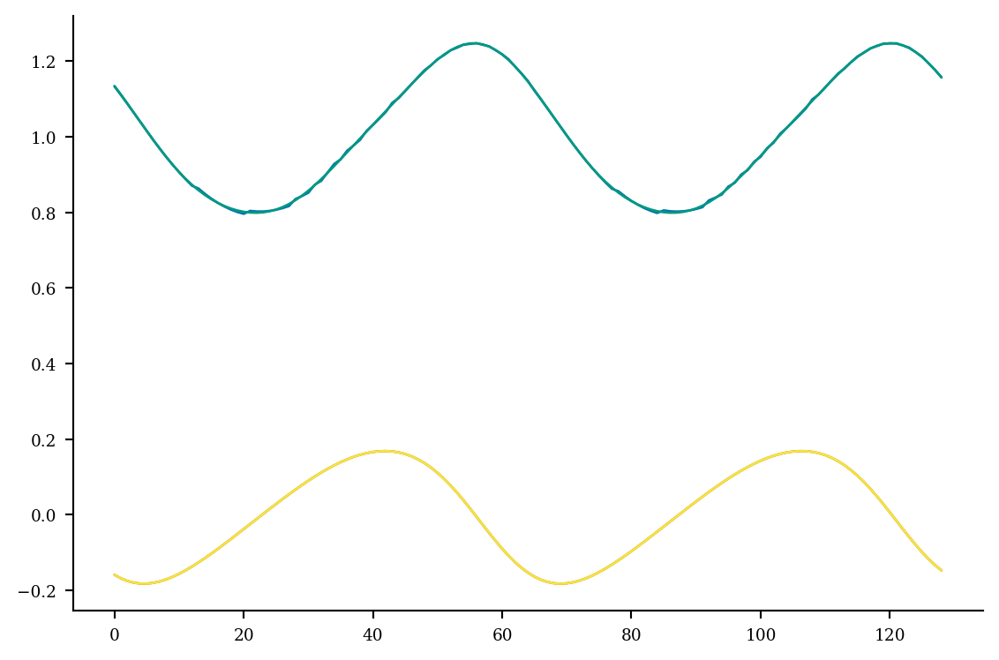

In [116]:
import numpy as np
import matplotlib.pyplot as plt

%config InlineBackend.figure_format = 'retina'

from desc.plotting import plot_3d, plot_boundary
from desc.grid import LinearGrid, Grid
from desc.basis import DoubleFourierSeries, ChebyshevPolynomial, PowerSeries, FourierSeries
from desc.transform import Transform
from desc.plotting import plot_coils
from desc.geometry import FourierXYCurve, FourierRZCurve
import desc.examples

eq = desc.examples.get('precise_QA')

grid = LinearGrid(M=64, N=64)
data = eq.surface.compute(["R", "Z"], grid=grid)
data = np.c_[data["R"], data["Z"]]
data = data.reshape(129, 129, 2)
idx = np.argmin(data[..., 1], axis=1)        # shape (129,)
data = data[np.arange(data.shape[0]), idx, :]
data = np.c_[data[:,0], grid.nodes[::129,2], data[:,1]]
z_0 = np.mean(data[:,2])
data[:,2] -= z_0
curve = FourierRZCurve.from_values(data, N=4, NFP=2, sym=False)
print(curve.R_n)
print(curve.Z_n)
print(z_0)
plt.plot(data[:,0])
plt.plot(data[:,2])

recon = curve.compute(["R", "Z"], grid=LinearGrid(N=64))
plt.plot(recon["R"])
plt.plot(recon["Z"])

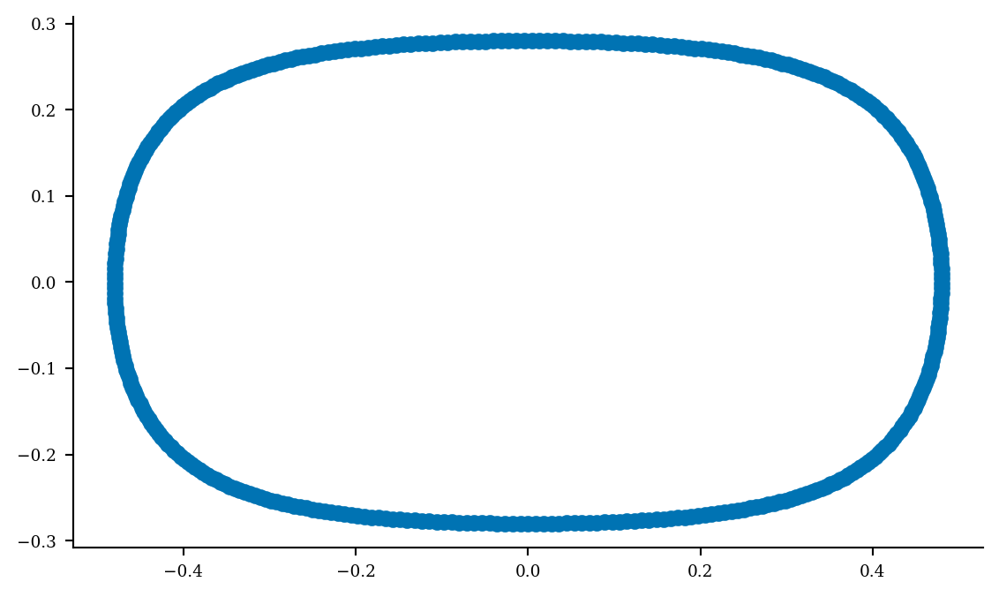

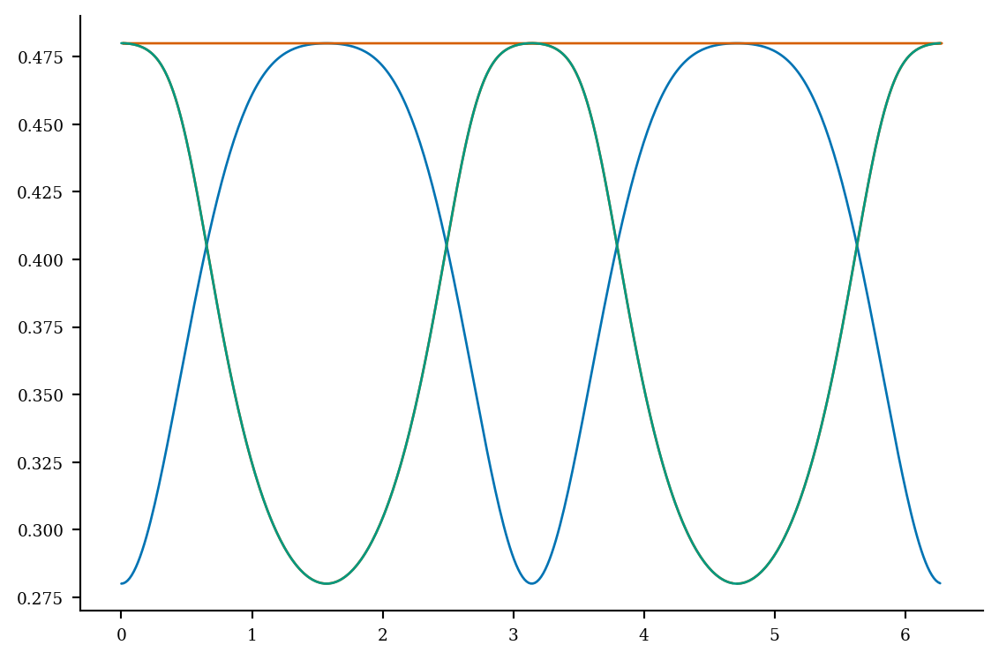

In [91]:
import numpy as np
import matplotlib.pyplot as plt

%config InlineBackend.figure_format = 'retina'

from desc.plotting import plot_3d, plot_boundary
from desc.grid import LinearGrid, Grid
from desc.basis import DoubleFourierSeries, ChebyshevPolynomial, PowerSeries, FourierSeries
from desc.transform import Transform
from desc.plotting import plot_coils
from desc.geometry import FourierXYCurve


curve = FourierXYCurve([0., 0., 0.], [0., 0., 1.], [0.02, 0.0, 0.5, 0., 0.0, 0.0], [0.0, 0.0, 0.0, -0.3, 0.0, 0.02], modes=[-3, -2, -1, 1, 2, 3])
grid = LinearGrid(N=196)
data = curve.compute(["X", "Y"], grid=grid)

dist = np.linalg.norm(np.c_[data["X"],data["Y"]], axis=1)
angles = np.atan2(data["Y"], data["X"])

basis = FourierSeries(16)
transform = Transform(
    Grid(np.c_[np.ones_like(data["Y"]), np.zeros_like(data["Y"]), np.atan2(data["Y"], data["X"])], sort=False),
    basis,
    build_pinv=True,
    method="direct1"
)
coefs = transform.fit(dist)
reconstruct = (basis.evaluate(grid) * coefs.reshape(1,-1)).sum(axis=1)


plt.scatter(data["X"], data["Y"])
plt.gca().set_aspect('equal')
plt.show()

plt.plot(grid.nodes[:,2], dist)
plt.plot(angles % (np.pi*2), dist)
plt.plot(grid.nodes[:,2], reconstruct)
plt.show()

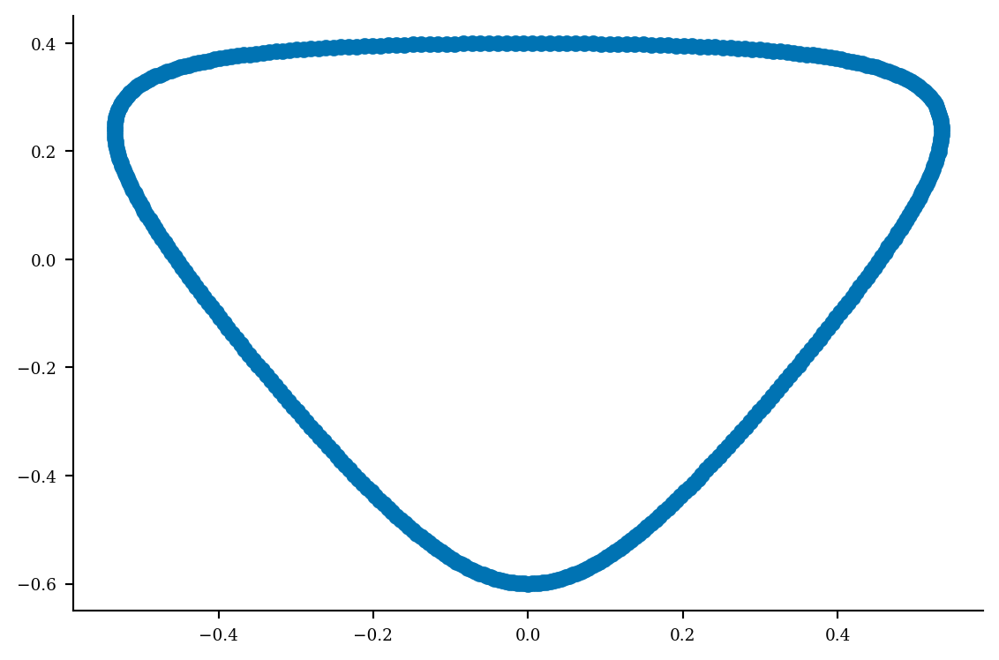

In [63]:
plt.scatter(data["X"], data["Y"])

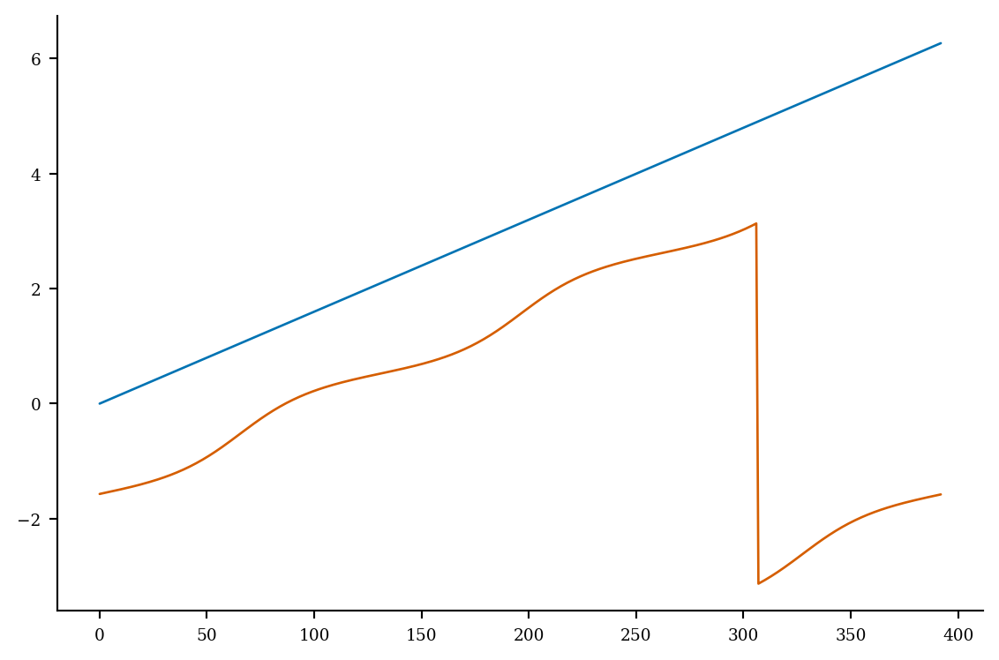

In [55]:
plt.plot(grid.nodes[:,2])
plt.plot(np.atan2(data["Y"], data["X"]))

In [49]:
grid.nodes

array([[1.        , 0.        , 0.        ],
       [1.        , 0.        , 0.01598775],
       [1.        , 0.        , 0.0319755 ],
       ...,
       [1.        , 0.        , 6.23522206],
       [1.        , 0.        , 6.25120981],
       [1.        , 0.        , 6.26719756]], shape=(393, 3))

In [ ]:
basis.evaluate(g, modes=np.c_[np.zeros_like(coefs), np.zeros_like(coefs), coefs]).sum(axis=1)

(49, 9)

In [1]:
import desc.examples
from desc.plotting import plot_3d, plot_boundary
from desc.grid import LinearGrid, Grid
from desc.basis import DoubleFourierSeries, ChebyshevPolynomial, PowerSeries
from desc.transform import Transform
import numpy as np
import matplotlib.pyplot as plt

%config InlineBackend.figure_format = 'retina'

eq = desc.examples.get("precise_QA")
surface = eq.surface
axis = eq.get_axis()

axis.R_n[0]

Array(1.01964961, dtype=float64)

In [4]:
eq.M

8

In [17]:
N=eq.N*2+1
M=eq.M*8+1

sample_grid = LinearGrid(rho=[1.0], N=N, M=M, NFP=2)
axis_points = axis.compute(["R", "Z"], grid=sample_grid)
axis_points = np.c_[axis_points["R"], axis_points["Z"]]
surface_points = eq.surface.compute(["R", "Z"], grid=sample_grid)
# weights = eq.surface.compute(["|e_theta x e_zeta|"], grid=sample_grid)["|e_theta x e_zeta|"]
surface_points = np.c_[surface_points["R"], surface_points["Z"]]
surface_points = surface_points - axis_points
surface_angles = np.atan2(surface_points[:,1], surface_points[:,0])
surface_distances = np.linalg.norm(surface_points, axis=1)

distance_basis = DoubleFourierSeries(M=8, N=8, NFP=2, sym='cos')
distance_transform = Transform(
    Grid(
        np.c_[np.ones_like(surface_angles), surface_angles, sample_grid.nodes[:,2]], 
        sort=False, 
        jitable=True
    ), 
    distance_basis, 
    # build=False, 
    # build_pinv=True,
    build=False, 
    build_pinv=True,
    method="direct1"
)

b = np.log2(surface_distances)
distance_transform.fit(b)
Db_lmn = distance_transform.fit(b)

In [18]:
Db_lmn[np.where(np.all([distance_transform.modes[:,2] == 0, distance_transform.modes[:,1] == 0], axis=0))[0]]
# distance_transform.modes[np.where(np.all([distance_transform.modes[:,1] == 0, distance_transform.modes[:,2] != 0], axis=0))[0]]

Array([-2.81704454], dtype=float64)

In [36]:
g = np.mgrid[-8:9,-8:9].astype(np.int32).T.reshape(-1,2)
mn_coef = np.zeros((16,16))
for p in g:
    if p[0] == 0 or p[1] == 0: continue
    if p[0] < 0: ixm = -p[0]-1
    else: ixm = p[0] + 7
    if p[1] < 0: ixn = -p[1]-1
    else: ixn = p[1] + 7
    i = np.where(np.all([p[0] == distance_transform.modes[:,1], p[1] == distance_transform.modes[:,2]], axis=0))[0]
    if len(i) == 0: continue
    else: i = i.item()
    mn_coef[ixm,ixn] = Db_lmn[i]
print(mn_coef[12:16,8:12])

[[ 0.01181127 -0.06554646 -0.08206368 -0.04338907]
 [ 0.00726408 -0.02810742 -0.05570656 -0.03682322]
 [-0.01249577  0.00204492  0.07636811  0.10294662]
 [-0.00287093 -0.00214231 -0.00090319 -0.01657501]]


In [7]:
Db_lmn

Array([ 1.98810259e-02, -8.40468075e-03,  8.38058038e-03,  1.16691222e-02,
        1.66098009e-02,  9.45840049e-04,  4.54236117e-02, -3.11009308e-03,
        3.82236859e-02, -1.28244844e-02,  1.28950413e-02,  1.70404977e-02,
        4.12250950e-02,  3.30596312e-03,  6.37698482e-02, -4.01499366e-03,
        4.74936982e-02, -3.76859165e-02,  2.76265077e-02,  1.13555338e-02,
        6.71582479e-02, -5.69487471e-03,  4.70103955e-02, -8.11744751e-03,
        4.48989395e-02, -8.79486894e-02,  7.59184683e-02, -4.19645438e-04,
        7.61443445e-02, -1.55597291e-02, -3.37000838e-05, -6.07840341e-03,
        4.19627133e-02, -1.31086347e-01,  1.53424266e-01,  5.07637081e-03,
        3.83300644e-02, -1.15558853e-02, -5.17662326e-02,  7.62170323e-03,
        5.51975075e-02, -1.06378236e-01,  2.09525826e-01,  3.91338233e-02,
       -6.31782996e-02, -4.49906551e-03, -5.42254512e-02,  2.35669873e-02,
        7.36673909e-02, -2.60302214e-02,  1.70984045e-01,  3.85490461e-02,
       -1.82575595e-01, -

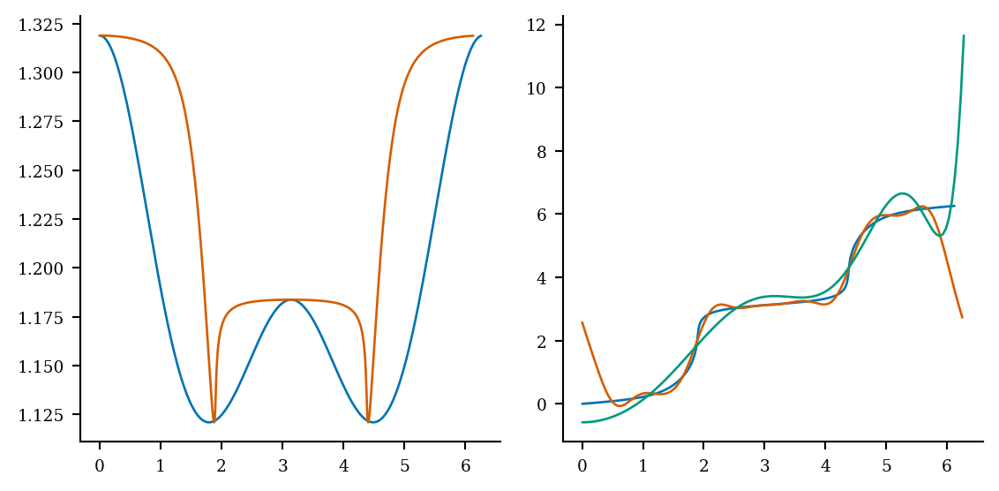

In [4]:
import desc.examples
from desc.plotting import plot_3d, plot_boundary
from desc.grid import LinearGrid, Grid
from desc.basis import DoubleFourierSeries, ChebyshevPolynomial, PowerSeries
from desc.transform import Transform
import numpy as np
import matplotlib.pyplot as plt

%config InlineBackend.figure_format = 'retina'

eq = desc.examples.get("precise_QA")
surface = eq.surface
axis = eq.get_axis()

M=128
N=8

grid = LinearGrid(M=M, N=N, NFP=2)

surface_data = surface.compute(["R", "Z"], grid=grid)
surface_data = np.c_[surface_data["R"], surface_data["Z"]]

axis_data = axis.compute(["R", "Z"], grid=grid)
axis_data = np.c_[axis_data["R"], axis_data["Z"]]

minor_vectors = surface_data - axis_data
theta = (np.arctan2(minor_vectors[:,1], -minor_vectors[:,0]) + np.pi) % (2.0 * np.pi)

sample_points = grid.nodes.reshape(N*2+1, M*2+1, 3)


theta_basis = DoubleFourierSeries(M=10, N=4, NFP=2, sym=False)
theta_transform = Transform(
    Grid(
        np.c_[np.ones_like(theta), theta, grid.nodes[:,2]], 
        sort=False, 
        jitable=True
    ), 
    theta_basis, 
    build=False, 
    build_pinv=True
)
Tb_lmn = theta_transform.fit(grid.nodes[:,1])

transformed_theta = Transform(
    grid, 
    theta_basis, 
    build=True,
).transform(Tb_lmn, 0, 0, 0)

grid2 = LinearGrid(L=M)
theta_basis2 = PowerSeries(12)
theta_transform2 = Transform(
    Grid(
        np.c_[theta[:M*2+1] / 2.0 / np.pi, np.zeros(M*2+1), np.zeros(M*2+1)], 
        sort=False, 
        jitable=True
    ), 
    theta_basis2, 
    build=False, 
    build_pinv=True
)
Tb_lmn2 = theta_transform2.fit(grid.nodes[:M*2+1,1] / 2.0 / np.pi)
transformed_theta2 = Transform(
    grid2, 
    theta_basis2, 
    build=True,
).transform(Tb_lmn2, 0, 0, 0)

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(6,3))
ax1.plot(sample_points[0,:M*2+1,1], surface_data[:M*2+1,0])
ax1.plot(theta[:M*2+1], surface_data[:M*2+1,0])
ax2.plot(theta[:M*2+1], sample_points[0,:M*2+1,1])
ax2.plot(sample_points[0,:M*2+1,1], transformed_theta[:M*2+1])
ax2.plot(grid2.nodes[:,0] * 2.0 * np.pi, transformed_theta2 * 2.0 * np.pi)
plt.show()

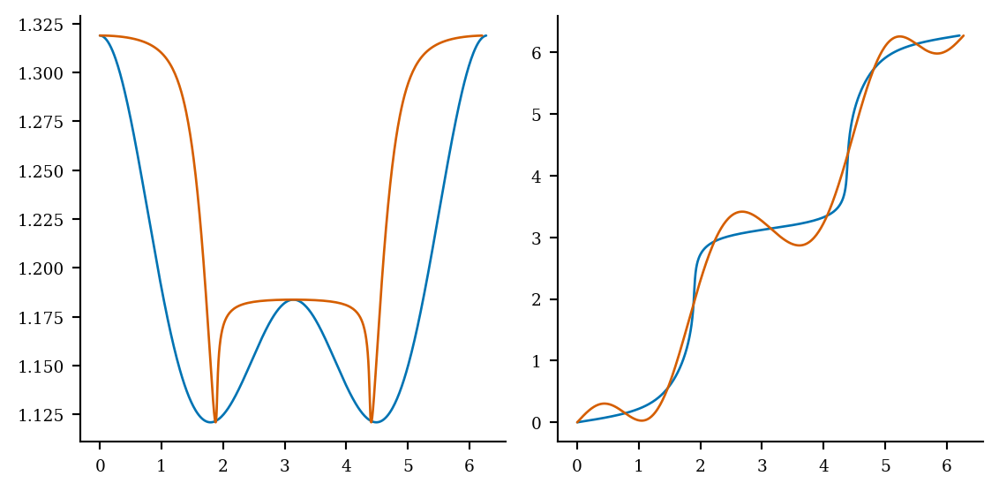

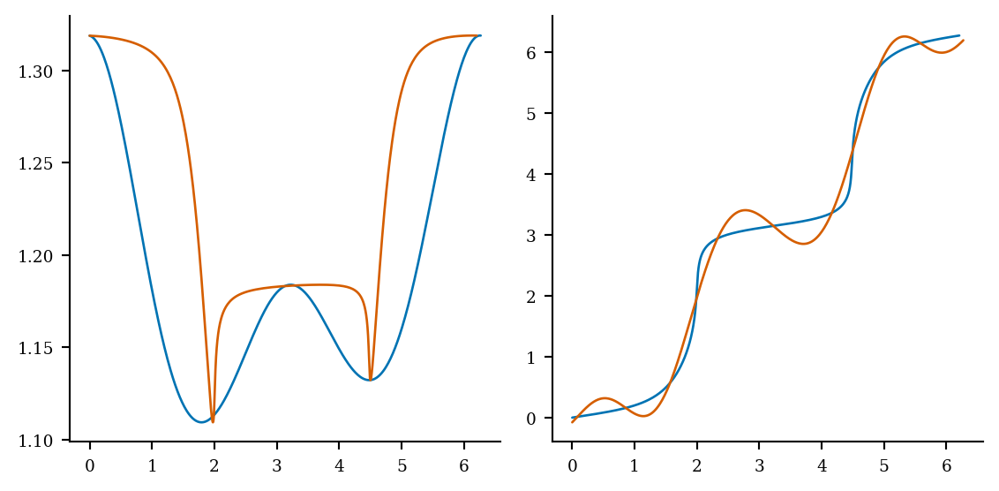

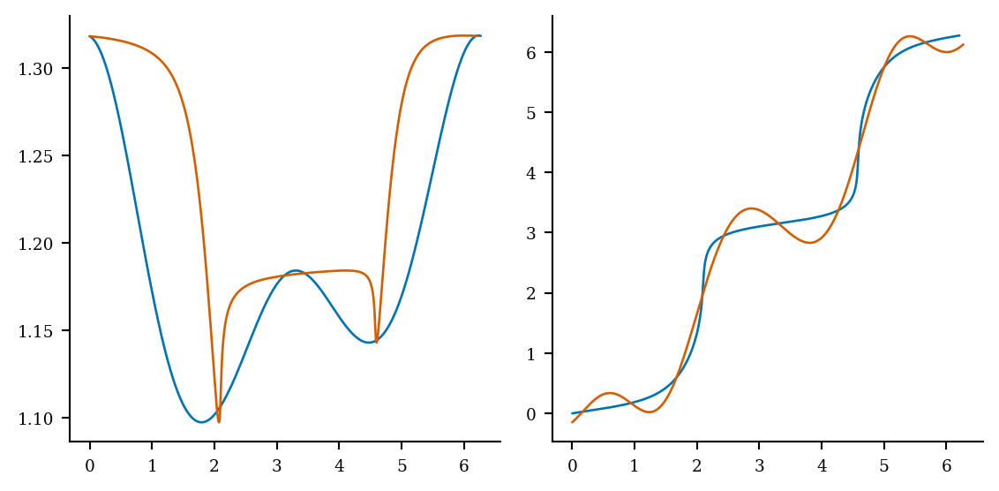

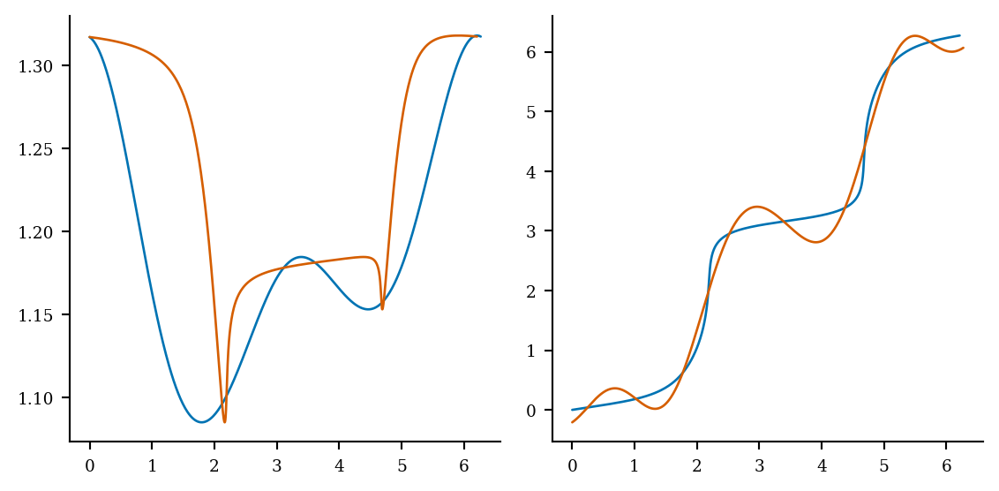

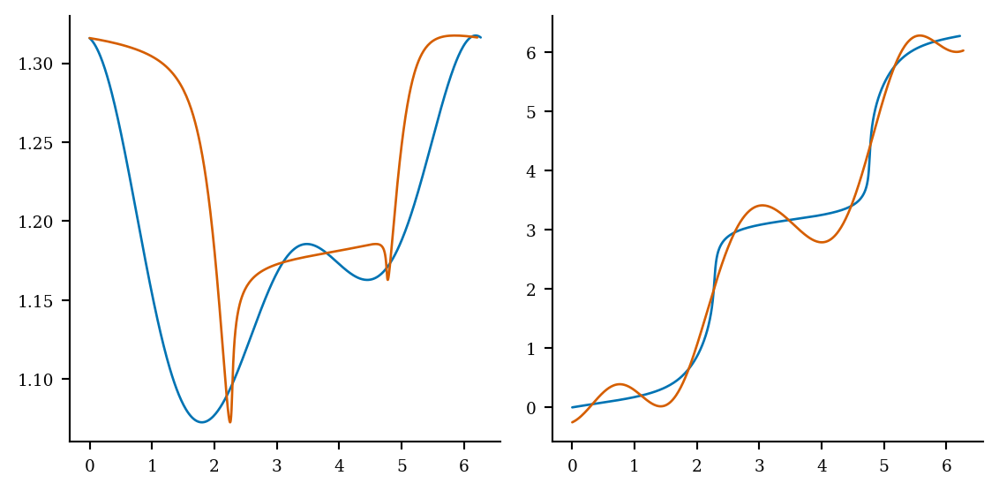

...

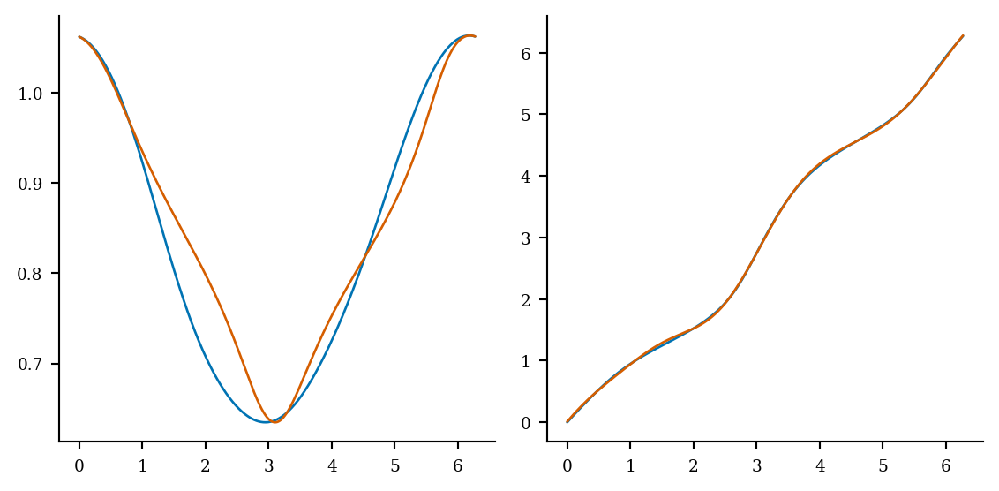

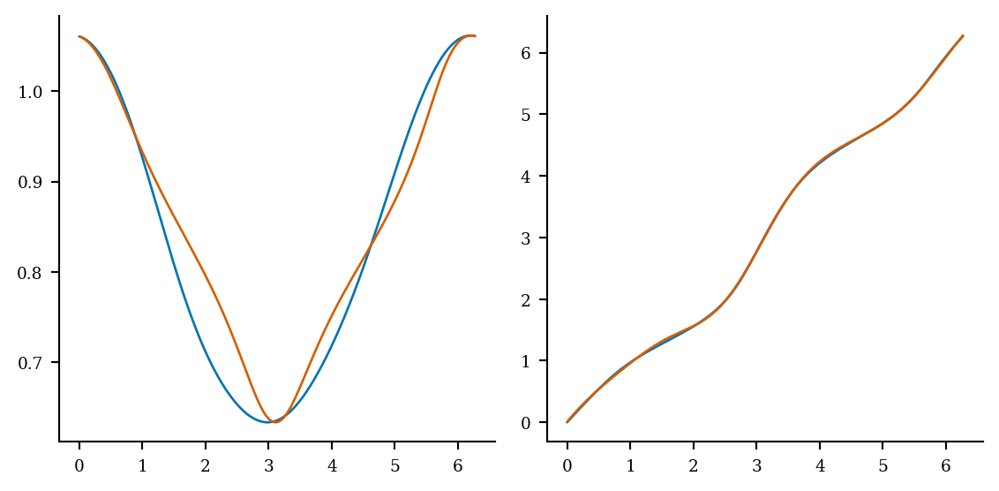

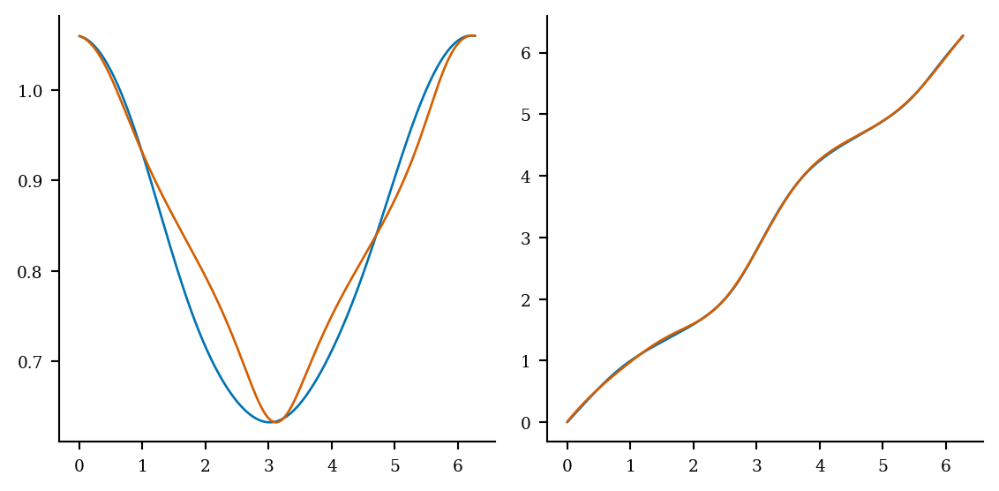

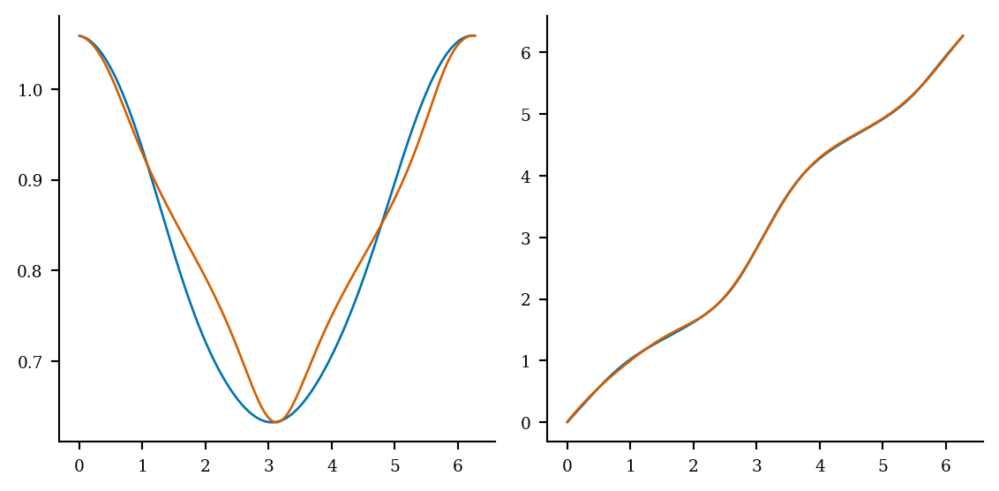

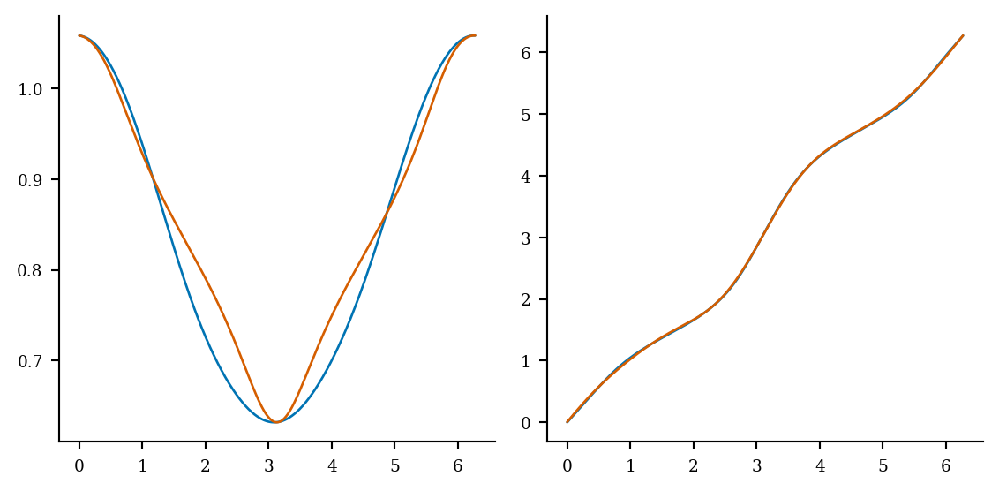

In [19]:
import desc.examples
from desc.plotting import plot_3d, plot_boundary
from desc.grid import LinearGrid, Grid
from desc.basis import DoubleFourierSeries, ChebyshevPolynomial, PowerSeries, FourierSeries
from desc.transform import Transform
import numpy as np
import matplotlib.pyplot as plt

%config InlineBackend.figure_format = 'retina'

eq = desc.examples.get("precise_QA")
surface = eq.surface
axis = eq.get_axis()

M=256
N=64

grid = LinearGrid(M=M, N=N, NFP=2)

surface_data = surface.compute(["R", "Z"], grid=grid)
surface_data = np.c_[surface_data["R"], surface_data["Z"]]

axis_data = axis.compute(["R", "Z"], grid=grid)
axis_data = np.c_[axis_data["R"], axis_data["Z"]]

minor_vectors = surface_data - axis_data
# theta = (np.arctan2(minor_vectors[:,1], -minor_vectors[:,0]) + np.pi) % (2.0 * np.pi)
theta = np.arctan2(minor_vectors[:,1], -minor_vectors[:,0]) + np.pi
tmp_theta_start = theta[::M*2+1].copy()
tmp_theta_start[tmp_theta_start>np.pi] -= 2.0*np.pi
theta -= tmp_theta_start.repeat(M*2+1)
theta = theta % (2.0 * np.pi)
# theta += tmp_theta_start

sample_points = grid.nodes.reshape(N*2+1, M*2+1, 3)

theta_start_basis = FourierSeries(N=4, NFP=2, sym='sin')
theta_start_transform = Transform(
    LinearGrid(
        N=N, 
        NFP=2,
    ), 
    theta_start_basis, 
    build=False, 
    build_pinv=True
)
Ts_n = theta_start_transform.fit(tmp_theta_start)


theta_basis = DoubleFourierSeries(M=4, N=8, NFP=2, sym='sin')
theta_transform = Transform(
    Grid(
        np.c_[np.ones_like(theta), theta, grid.nodes[:,2]], 
        sort=False, 
        jitable=True
    ), 
    theta_basis, 
    build=False, 
    build_pinv=True
)
Tb_lmn = theta_transform.fit(grid.nodes[:,1] - theta)

transformed_theta = Transform(
    grid, 
    theta_basis, 
    build=True,
).transform(Tb_lmn, 0, 0, 0)

for i in range(N):
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(6,3))
    s = i * (M*2+1)
    e = (i+1) * (M*2+1)
    ax1.plot(sample_points[i,:,1], surface_data[s:e,0])
    ax1.plot(theta[s:e], surface_data[s:e,0])
    ax2.plot(theta[s:e], sample_points[i,:,1])
    ax2.plot(sample_points[i,:,1], transformed_theta[s:e] + sample_points[i,:,1])
    plt.show()

In [93]:
for m, c in zip(theta_basis.modes, Tb_lmn):
    print(m, c)

[ 0  0 -8] -0.010595392603088056
[ 0  1 -8] 0.008805592846374537
[ 0  2 -8] 0.02214052160576823
[ 0  3 -8] -0.02502028287365168
[ 0  4 -8] -0.014409932884261956
[ 0  0 -7] -0.01291431395566557
[ 0  1 -7] 0.010427936132103964
[ 0  2 -7] 0.031663441077384176
[ 0  3 -7] -0.044576669314793094
[ 0  4 -7] -0.02374472344620071
[ 0  0 -6] -0.015450866181378708
[ 0  1 -6] 0.010755594397433916
[ 0  2 -6] 0.04478867229897964
[ 0  3 -6] -0.06652509771830462
[ 0  4 -6] -0.032942623486484905
[ 0  0 -5] -0.0225055881755856
[ 0  1 -5] 0.012791388160219614
[ 0  2 -5] 0.06706091807907458
[ 0  3 -5] -0.09400257903819917
[ 0  4 -5] -0.04262041389714202
[ 0  0 -4] -0.03985903939017489
[ 0  1 -4] 0.020507480195005298
[ 0  2 -4] 0.10536365896133977
[ 0  3 -4] -0.12630068342661943
[ 0  4 -4] -0.053914903849172933
[ 0  0 -3] -0.07912473188107762
[ 0  1 -3] 0.03911136594720294
[ 0  2 -3] 0.1590861114559701
[ 0  3 -3] -0.14600294180437098
[ 0  4 -3] -0.04866989409586371
[ 0  0 -2] -0.2040812388840856
[ 0  1 -2] 

In [20]:
Ts_n

Array([-0.03721455, -0.08002005, -0.18206658, -0.42863913], dtype=float64)

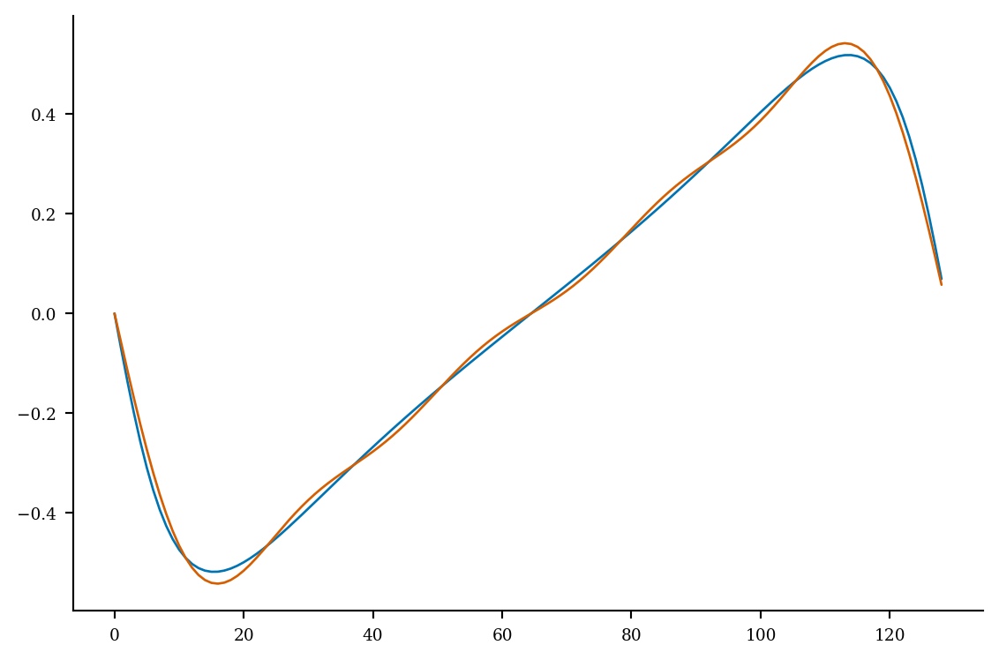

In [16]:
tmp_theta_start[tmp_theta_start>np.pi] -= 2.0*np.pi
plt.plot(tmp_theta_start)
transformed_theta_start = Transform(
    LinearGrid(
        N=N, 
        NFP=2
    ), 
    theta_start_basis, 
    build=True,
).transform(Ts_n, 0, 0, 0)
plt.plot(transformed_theta_start)

In [21]:
for m, c in zip(surface.R_basis.modes, surface.R_lmn):
    print(m, c)

[ 0 -8 -8] -2.0740599232993023e-09
[ 0 -7 -8] -4.682805575853149e-10
[ 0 -6 -8] -1.881981674093158e-09
[ 0 -5 -8] 1.1578145663302794e-11
[ 0 -4 -8] 5.984480200212767e-10
[ 0 -3 -8] 7.62538566700838e-10
[ 0 -2 -8] -3.347918940984995e-10
[ 0 -1 -8] 2.091540852315281e-09
[ 0 -8 -7] -9.691652817538962e-09
[ 0 -7 -7] 3.137488883590532e-07
[ 0 -6 -7] 1.3965642784785618e-08
[ 0 -5 -7] 1.0629105235627623e-07
[ 0 -4 -7] -1.029608483692375e-09
[ 0 -3 -7] -4.026292395259625e-08
[ 0 -2 -7] -5.122074956937111e-09
[ 0 -1 -7] -2.3557716984704852e-08
[ 0 -8 -6] -7.674048618064794e-09
[ 0 -7 -6] 4.129830119648322e-07
[ 0 -6 -6] -4.509577861678662e-08
[ 0 -5 -6] -1.0569691922412212e-07
[ 0 -4 -6] 2.319561441255777e-07
[ 0 -3 -6] 7.040225916467776e-08
[ 0 -2 -6] -1.0849247496106808e-07
[ 0 -1 -6] 1.2478342859484978e-07
[ 0 -8 -5] 2.7190231956315924e-09
[ 0 -7 -5] -1.619378717884307e-07
[ 0 -6 -5] -9.844154247450484e-07
[ 0 -5 -5] 2.514409008276808e-06
[ 0 -4 -5] 4.7185983444582856e-07
[ 0 -3 -5] -1.83787

In [26]:
i = 0
j = 0
surface.R_lmn[np.where(np.all(np.c_[surface.R_basis.modes[:,1] == j+1, surface.R_basis.modes[:,2] == i+1], axis=1))[0][0]]

np.float64(-0.07444245337161019)

In [ ]:
for i in [-5, -6, -7, -8]: # n
    for j in [0]: # m
        print(surface.Z_lmn[np.where(np.all(np.c_[surface.Z_basis.modes[:,1] == j, surface.Z_basis.modes[:,2] == i], axis=1))[0][0]], end='')
        print(", ", end='')
    print()

6.013807919962239e-07, -1.3683319532788955e-09, -1.6869223918688115e-08, 7.657206740036527e-10, 

In [36]:
surface.Z_basis.modes

array([[ 0,  0, -8],
       [ 0,  1, -8],
       [ 0,  2, -8],
       [ 0,  3, -8],
       [ 0,  4, -8],
       [ 0,  5, -8],
       [ 0,  6, -8],
       [ 0,  7, -8],
       [ 0,  8, -8],
       [ 0,  0, -7],
       [ 0,  1, -7],
       [ 0,  2, -7],
       [ 0,  3, -7],
       [ 0,  4, -7],
       [ 0,  5, -7],
       [ 0,  6, -7],
       [ 0,  7, -7],
       [ 0,  8, -7],
       [ 0,  0, -6],
       [ 0,  1, -6],
       [ 0,  2, -6],
       [ 0,  3, -6],
       [ 0,  4, -6],
       [ 0,  5, -6],
       [ 0,  6, -6],
       [ 0,  7, -6],
       [ 0,  8, -6],
       [ 0,  0, -5],
       [ 0,  1, -5],
       [ 0,  2, -5],
       [ 0,  3, -5],
       [ 0,  4, -5],
       [ 0,  5, -5],
       [ 0,  6, -5],
       [ 0,  7, -5],
       [ 0,  8, -5],
       [ 0,  0, -4],
       [ 0,  1, -4],
       [ 0,  2, -4],
       [ 0,  3, -4],
       [ 0,  4, -4],
       [ 0,  5, -4],
       [ 0,  6, -4],
       [ 0,  7, -4],
       [ 0,  8, -4],
       [ 0,  0, -3],
       [ 0,  1, -3],
       [ 0,  

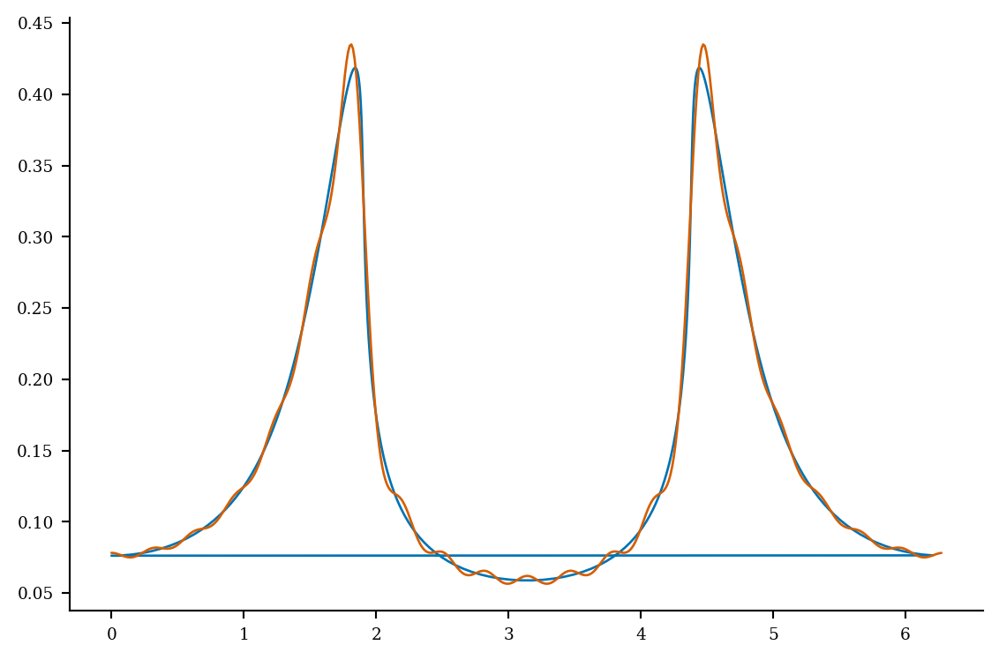

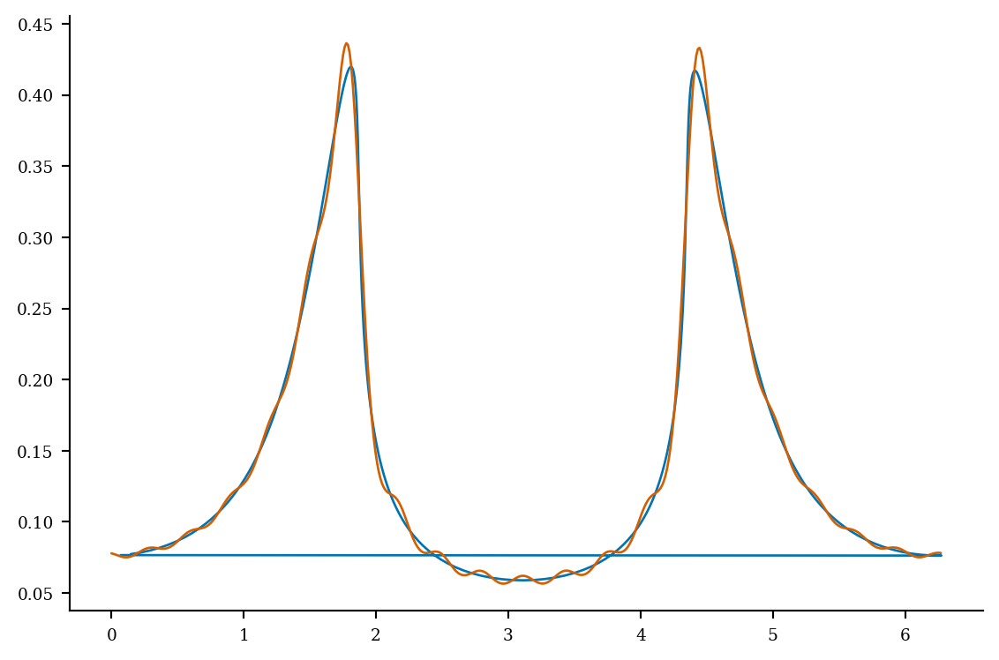

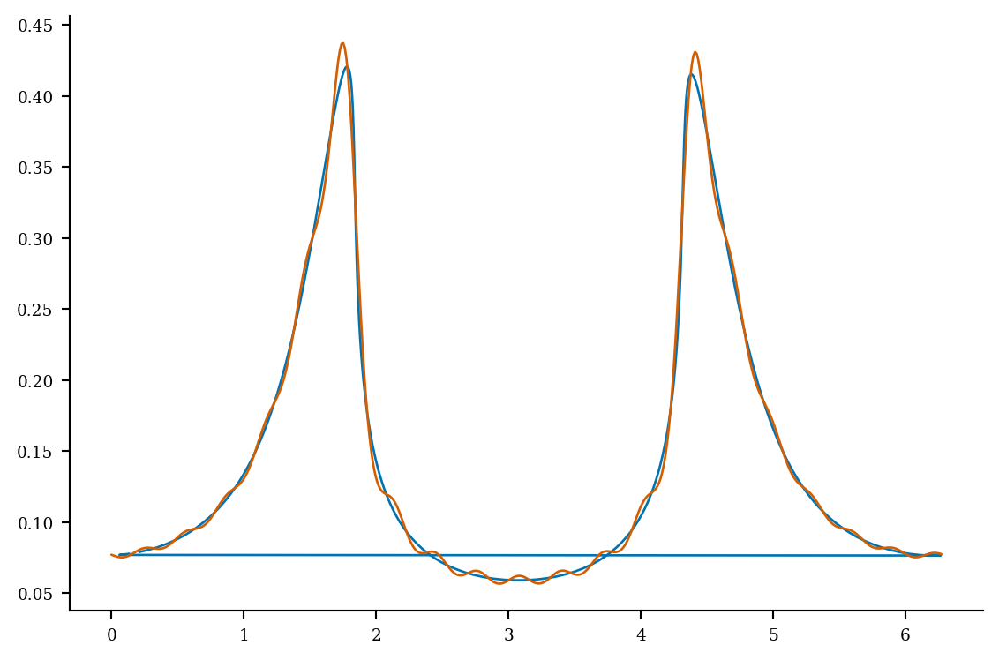

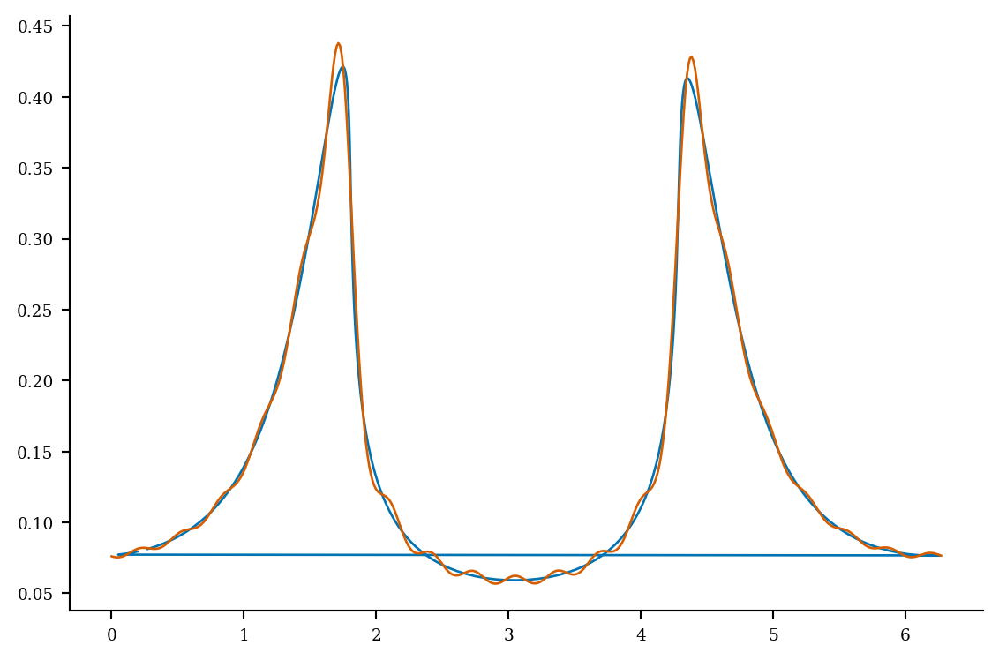

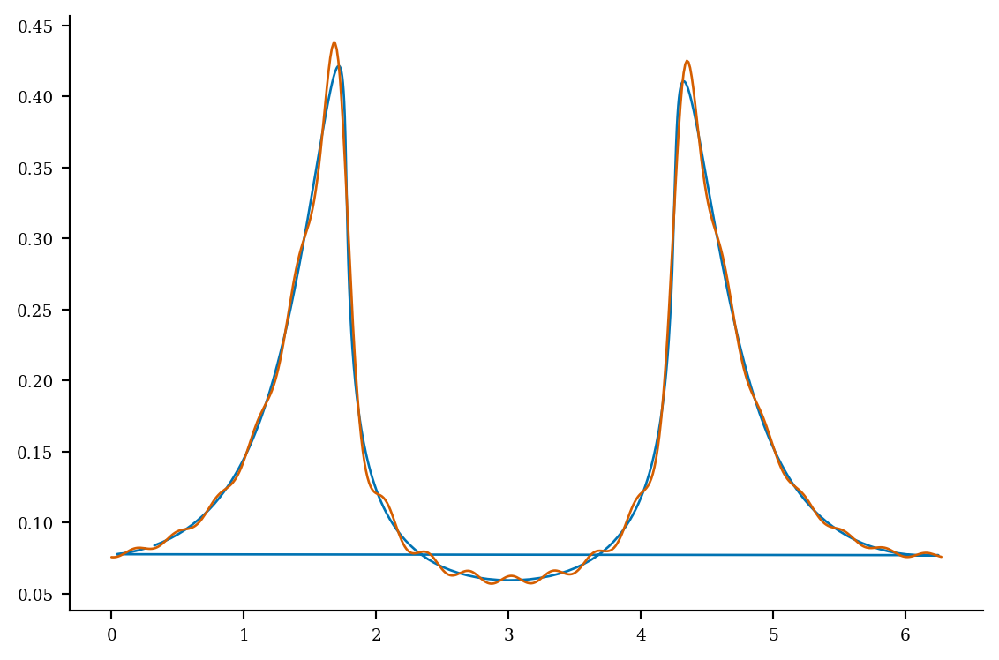

...

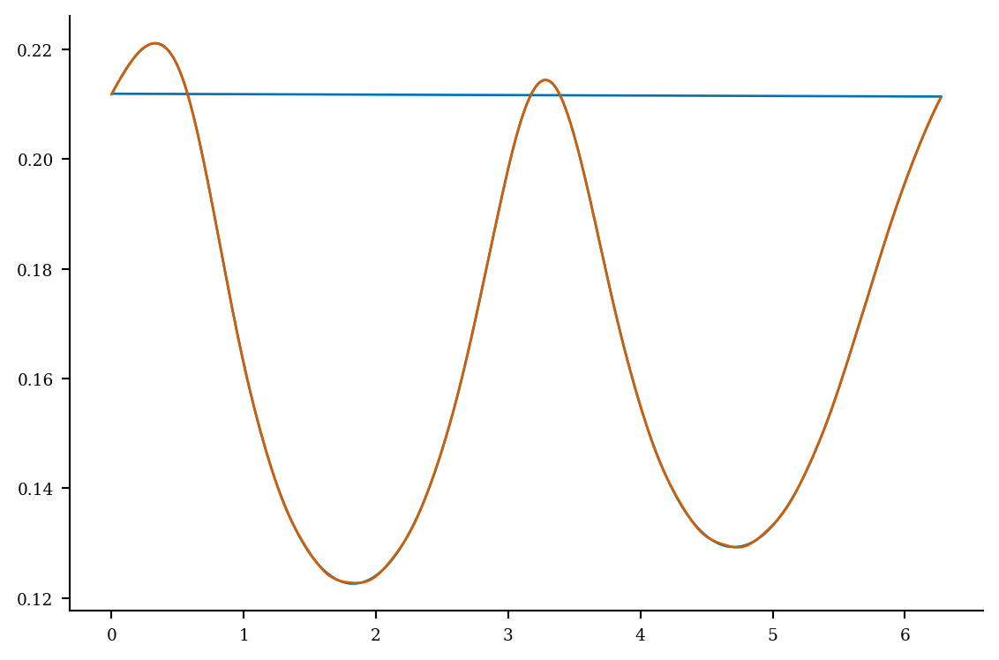

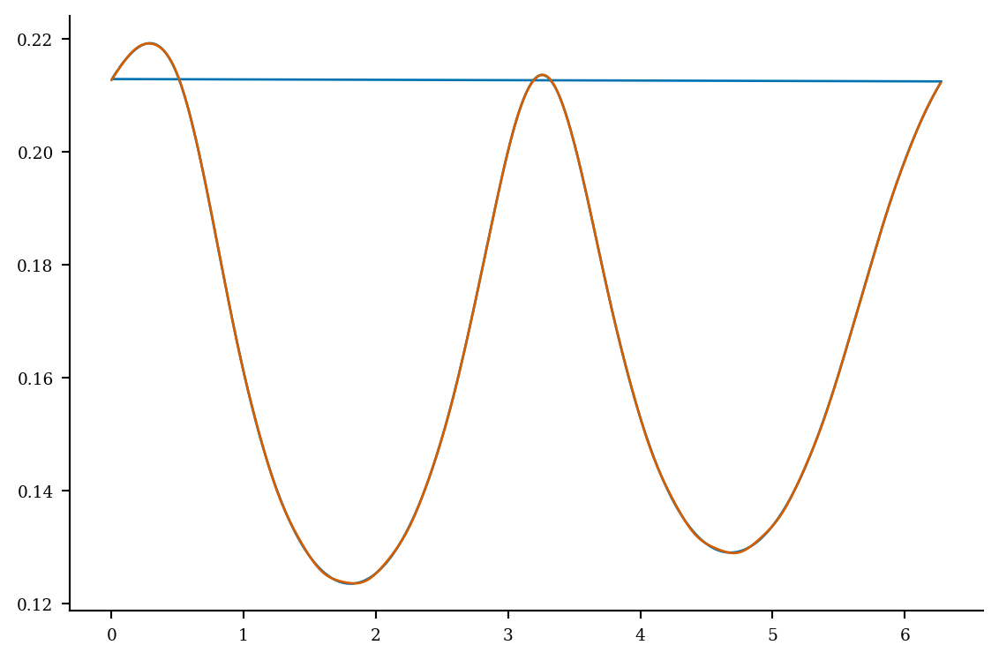

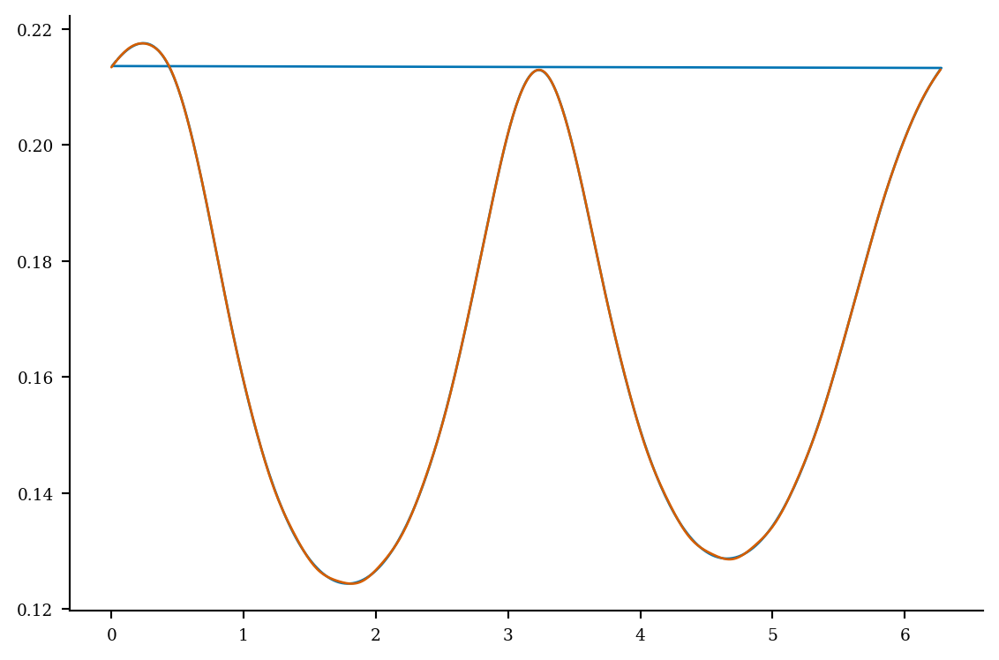

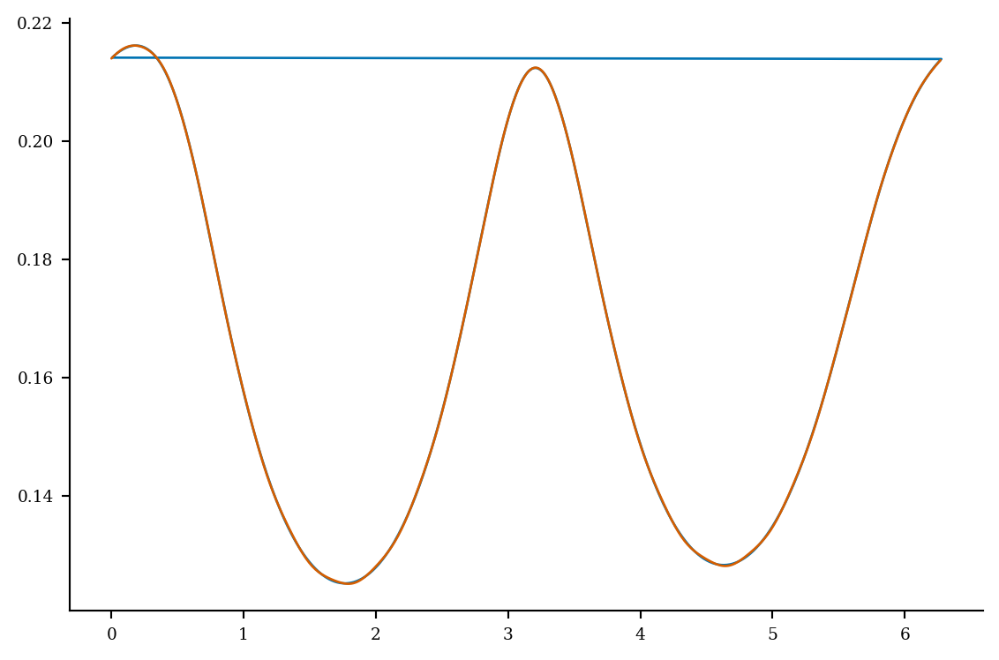

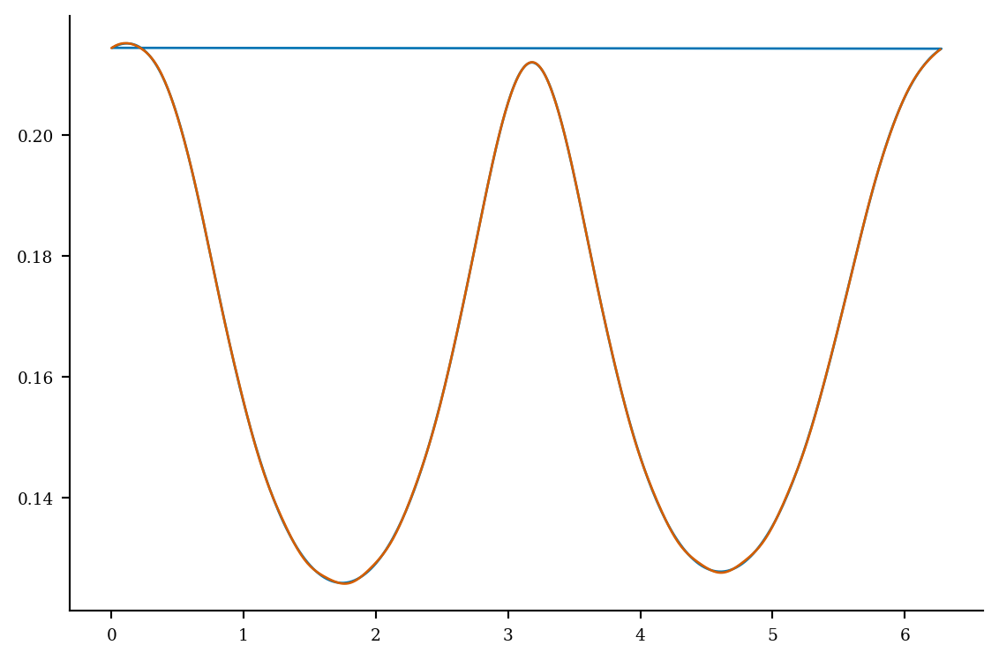

In [86]:
from desc.plotting import plot_3d
import desc.examples
from desc.grid import Grid, LinearGrid
from desc.transform import Transform
from desc.basis import DoubleFourierSeries
import numpy as np
import matplotlib.pyplot as plt

%config InlineBackend.figure_format = 'retina'

eq = desc.examples.get("precise_QA")
surface = eq.surface
axis = eq.get_axis()

N=64
M=256

sample_grid = LinearGrid(rho=[1.0], N=N, M=M, NFP=2)
axis_points = axis.compute(["R", "Z"], grid=sample_grid)
axis_points = np.c_[axis_points["R"], axis_points["Z"]]
surface_points = surface.compute(["R", "Z"], grid=sample_grid)
weights = surface.compute(["|e_theta x e_zeta|"], grid=sample_grid)["|e_theta x e_zeta|"]
surface_points = np.c_[surface_points["R"], surface_points["Z"]]
surface_points = surface_points - axis_points
surface_angles = np.atan2(surface_points[:,1], surface_points[:,0])
surface_distances = np.linalg.norm(surface_points, axis=1)

distance_basis = DoubleFourierSeries(M=20, N=16, NFP=2, sym='cos')
distance_transform = Transform(
    Grid(
        np.c_[np.ones_like(surface_angles), surface_angles, sample_grid.nodes[:,2]], 
        sort=False, 
        jitable=True
    ), 
    distance_basis, 
    # build=False, 
    # build_pinv=True,
    build=True, 
    build_pinv=False,
    method="direct1"
)
# Db_lmn = distance_transform.fit(surface_distances)

weights = np.ones_like(weights)
W = np.diag(weights)
A = distance_transform.matrices[distance_transform.method][0][0][0]
b = np.log2(surface_distances)
Db_lmn = np.linalg.lstsq(W @ A, weights * b, rcond=None)[0]

transformed_distance = Transform(
    sample_grid,
    distance_basis, 
    build=True,
).transform(Db_lmn, 0, 0, 0)
transformed_distance = 2.0 ** transformed_distance

for i in range(N):
    plt.plot(surface_angles[i*(M*2+1):(i+1)*(M*2+1)] % (np.pi*2.0), surface_distances[i*(M*2+1):(i+1)*(M*2+1)])
    plt.plot(sample_grid.nodes[i*(M*2+1):(i+1)*(M*2+1),1], transformed_distance[i*(M*2+1):(i+1)*(M*2+1)])
    plt.show()

In [47]:
distance_basis.modes

array([[ 0, -8, -8],
       [ 0, -7, -8],
       [ 0, -6, -8],
       [ 0, -5, -8],
       [ 0, -4, -8],
       [ 0, -3, -8],
       [ 0, -2, -8],
       [ 0, -1, -8],
       [ 0, -8, -7],
       [ 0, -7, -7],
       [ 0, -6, -7],
       [ 0, -5, -7],
       [ 0, -4, -7],
       [ 0, -3, -7],
       [ 0, -2, -7],
       [ 0, -1, -7],
       [ 0, -8, -6],
       [ 0, -7, -6],
       [ 0, -6, -6],
       [ 0, -5, -6],
       [ 0, -4, -6],
       [ 0, -3, -6],
       [ 0, -2, -6],
       [ 0, -1, -6],
       [ 0, -8, -5],
       [ 0, -7, -5],
       [ 0, -6, -5],
       [ 0, -5, -5],
       [ 0, -4, -5],
       [ 0, -3, -5],
       [ 0, -2, -5],
       [ 0, -1, -5],
       [ 0, -8, -4],
       [ 0, -7, -4],
       [ 0, -6, -4],
       [ 0, -5, -4],
       [ 0, -4, -4],
       [ 0, -3, -4],
       [ 0, -2, -4],
       [ 0, -1, -4],
       [ 0, -8, -3],
       [ 0, -7, -3],
       [ 0, -6, -3],
       [ 0, -5, -3],
       [ 0, -4, -3],
       [ 0, -3, -3],
       [ 0, -2, -3],
       [ 0, -

In [88]:
def get_coefs(m, n):
    m_phase = "0"
    n_phase = "0"
    m_range = ""
    n_range = ""
    if m[0] > 0:
        m_phase = "cos"
        m_range = f"_{abs(m[0])}to{abs(m[-1])}"
    elif m[0] < 0:
        m_phase = "sin"
        m_range = f"_{abs(m[0])}to{abs(m[-1])}"
    if n[0] > 0:
        n_phase = "cos"
        n_range = f"_{abs(n[0])}to{abs(n[-1])}"
    elif n[0] < 0:
        n_phase = "sin"
        n_range = f"_{abs(n[0])}to{abs(n[-1])}"

    type = "mat4"
    if len(n) == 1 or len(m) == 1: type = "vec4"

    print(f"const {type} D_coef_m{m_phase}{m_range}_n{n_phase}{n_range} = {type}(")
    for i in m: # m
        for j in n: # n
        # for j in [0]: # m
            print(Db_lmn[np.where(np.all(np.c_[distance_basis.modes[:,1] == i, distance_basis.modes[:,2] == j], axis=1))[0][0]], end='')
            print(", ", end='')
        if len(n) > 1: print()
    print(");")

In [5]:
from desc.plotting import plot_3d
import desc.examples
eq = desc.examples.get("precise_QA")
surface = eq.surface
plot_3d(eq, "|B|")

/Users/andy/.pyenv/versions/topax-dev/lib/python3.13/site-packages/desc/utils.py:572: UserWarning: Unequal number of field periods for grid 1 and basis 2.
  warnings.warn(msg, err)
/Users/andy/.pyenv/versions/topax-dev/lib/python3.13/site-packages/desc/utils.py:572: UserWarning: Unequal number of field periods for grid 1 and basis 2.
  warnings.warn(msg, err)


In [91]:
cos1to4 = np.array([1,2,3,4], dtype=np.int32)
cos5to8 = np.array([5,6,7,8], dtype=np.int32)
cos9to12 = np.array([9,10,11,12], dtype=np.int32)
cos13to16 = np.array([13,14,15,16], dtype=np.int32)
cos17to20 = np.array([17,18,19,20], dtype=np.int32)

get_coefs(-cos1to4, -cos1to4)
get_coefs(-cos5to8, -cos1to4)
get_coefs(-cos9to12, -cos1to4)
get_coefs(-cos13to16, -cos1to4)
get_coefs(-cos17to20, -cos1to4)
get_coefs(-cos1to4, -cos5to8)
get_coefs(-cos5to8, -cos5to8)
get_coefs(-cos9to12, -cos5to8)
get_coefs(-cos13to16, -cos5to8)
get_coefs(-cos17to20, -cos5to8)
get_coefs(-cos1to4, -cos9to12)
get_coefs(-cos5to8, -cos9to12)
get_coefs(-cos9to12, -cos9to12)
get_coefs(-cos13to16, -cos9to12)
get_coefs(-cos17to20, -cos9to12)
get_coefs(-cos1to4, -cos13to16)
get_coefs(-cos5to8, -cos13to16)
get_coefs(-cos9to12, -cos13to16)
get_coefs(-cos13to16, -cos13to16)
get_coefs(-cos17to20, -cos13to16)

const mat4 D_coef_msin_1to4_nsin_1to4 = mat4(
-0.05845820546274837, -0.018349415928120227, -0.0034733117915668743, -0.0004234202835655121, 
0.7751343991802787, 0.20878871234911778, 0.0422310901826881, 0.007045892116423161, 
-0.06880597035650146, -0.08077490045238858, -0.02578750846469173, -0.005126626672819535, 
-0.05765894795081605, -0.17569330543646544, -0.09234943998352999, -0.031118523691322994, 
);
const mat4 D_coef_msin_5to8_nsin_1to4 = mat4(
-0.0158951728507543, 0.06580941942321059, 0.08032554006787587, 0.04149813430766226, 
-0.011676620733231646, 0.02136209540174542, 0.044180731373992754, 0.027345753738435695, 
0.009287190395525474, 0.005684730800075791, -0.04254366748149224, -0.058102007273662146, 
0.001907803939891331, 0.00016427678018688524, -0.004753656157192441, 0.00044763840244053943, 
);
const mat4 D_coef_msin_9to12_nsin_1to4 = mat4(
0.0013860707312770212, -0.007538249739430444, -0.0021896700084618817, 0.023142257433389657, 
-0.00024428053707052817, -5.4245401256119985e-

In [95]:
get_coefs([0], cos1to4)
get_coefs([0], cos5to8)
get_coefs([0], cos9to12)
get_coefs([0], cos13to16)

const vec4 D_coef_m0_ncos_1to4 = vec4(
-0.23594032069900323, -0.043277262350318646, -0.004850029566738561, -0.0003793192879669102, 
);
const vec4 D_coef_m0_ncos_5to8 = vec4(
-5.764118030368581e-06, 1.1181472592155378e-05, 7.012519894811914e-06, 2.526022819162449e-06, 
);
const vec4 D_coef_m0_ncos_9to12 = vec4(
-2.500075552622216e-07, -8.468584784399047e-07, -3.476795721879533e-07, -9.377890075601414e-09, 
);
const vec4 D_coef_m0_ncos_13to16 = vec4(
3.652263880216111e-09, -3.124761985273672e-08, -3.8505666537236305e-09, 5.457503132744179e-08, 
);


In [96]:
get_coefs(cos1to4, [0])
get_coefs(cos5to8, [0])
get_coefs(cos9to12, [0])
get_coefs(cos13to16, [0])
get_coefs(cos17to20, [0])

const vec4 D_coef_mcos_1to4_n0 = vec4(
0.08478398882539505, -0.12198555906761666, -0.02615150574546886, -0.029701246956926608, );
const vec4 D_coef_mcos_5to8_n0 = vec4(
0.005588935234055362, 0.002906869332731335, 0.002249749424844818, 0.0007639063427044715, );
const vec4 D_coef_mcos_9to12_n0 = vec4(
-0.0007943198298761764, -0.00010083079530814887, -0.00024288438446865013, 5.6797413063476576e-05, );
const vec4 D_coef_mcos_13to16_n0 = vec4(
7.558685037952276e-05, 1.2264284449734278e-05, 1.6417423783360308e-05, -2.4252168971082566e-05, );
const vec4 D_coef_mcos_17to20_n0 = vec4(
-2.0882089453028163e-06, -8.523928300835371e-07, 2.82571794291836e-06, 3.247185973378683e-06, );


In [97]:
def get_coefs(lmn, basis, m, n):
    m_phase = "0"
    n_phase = "0"
    m_range = ""
    n_range = ""
    if m[0] > 0:
        m_phase = "cos"
        m_range = f"_{abs(m[0])}to{abs(m[-1])}"
    elif m[0] < 0:
        m_phase = "sin"
        m_range = f"_{abs(m[0])}to{abs(m[-1])}"
    if n[0] > 0:
        n_phase = "cos"
        n_range = f"_{abs(n[0])}to{abs(n[-1])}"
    elif n[0] < 0:
        n_phase = "sin"
        n_range = f"_{abs(n[0])}to{abs(n[-1])}"

    type = "mat4"
    if len(n) == 1 or len(m) == 1: type = "vec4"

    print(f"const {type} D_coef_m{m_phase}{m_range}_n{n_phase}{n_range} = {type}(")
    for i in m: # m
        for j in n: # n
        # for j in [0]: # m
            print(lmn[np.where(np.all(np.c_[basis.modes[:,1] == i, basis.modes[:,2] == j], axis=1))[0][0]], end='')
            print(", ", end='')
        if len(n) > 1: print()
    print(");")

In [110]:
get_coefs(surface.Z_lmn, surface.Z_basis, -cos1to4, [0])
get_coefs(surface.Z_lmn, surface.Z_basis, -cos5to8, [0])
get_coefs(surface.Z_lmn, surface.Z_basis, [0], -cos1to4)
get_coefs(surface.Z_lmn, surface.Z_basis, [0], -cos5to8)


const vec4 D_coef_msin_1to4_n0 = vec4(
-0.24313441064699526, -0.026604330123313983, -0.007592243529224662, -0.0002549573114899858, );
const vec4 D_coef_msin_5to8_n0 = vec4(
-7.08967072281184e-05, 1.1170811318312778e-06, 5.398010810217722e-06, 5.569126614002186e-07, );
const vec4 D_coef_m0_nsin_1to4 = vec4(
-0.11953841059171537, -0.00875887958835589, 0.00043665508838077995, 0.00010057994122673418, 
);
const vec4 D_coef_m0_nsin_5to8 = vec4(
6.013807919962239e-07, -1.3683319532788955e-09, -1.6869223918688115e-08, 7.657206740036527e-10, 
);
